In [1]:
import os
import mne
import openpyxl
import numpy as np
import matplotlib.pyplot as plt

In [2]:
dir_path = "./openmiir/eeg/mne/"
raw = mne.io.read_raw_fif(dir_path + "P01-raw.fif", preload=True)
raw.set_eeg_reference()
print(raw)
print(raw.info)

Opening raw data file ./openmiir/eeg/mne/P01-raw.fif...
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
    Range : 0 ... 2478165 =      0.000 ...  4840.166 secs
Ready.
Reading 0 ... 2478165  =      0.000 ...  4840.166 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Removing existing average EEG reference projection.
<Raw | P01-raw.fif, 69 x 2478166 (4840.2 s), ~1.27 GB, data loaded>
<Info | 11 non-empty values
 bads: 3 items (P8, P10, T8)
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG, 4 EOG, 1 Stimulus
 custom_ref_applied: True
 file_id: 4 items (dict)
 highpass: 0.0 Hz
 lowpass: 104.0 Hz
 meas_date: 2015-01-28 17:39:57 UTC
 meas_id: 4 items (dict)
 nchan: 69
 projs: []
 sfreq: 512.0 Hz
>


In [18]:
print("- type: ", type(raw))
print("- channels: ", raw.ch_names)
print("- time point: ", raw.n_times)

- type:  <class 'mne.io.fiff.raw.Raw'>
- channels:  ['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'STI 014']
- time point:  2478166


Using matplotlib as 2D backend.


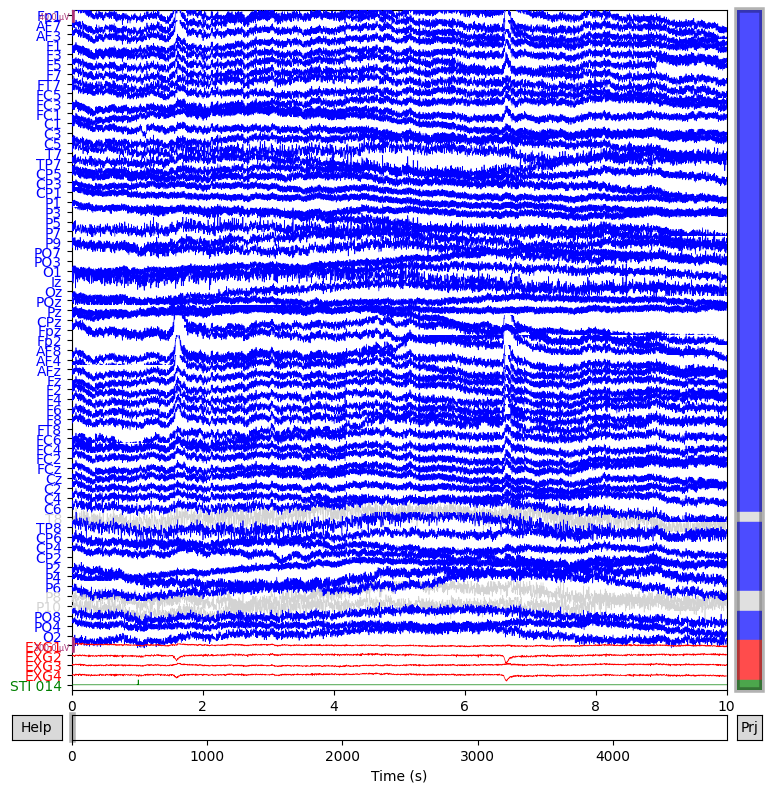

In [19]:
%matplotlib inline
color = dict(eeg='blue',eog='red', stim='green')
p = raw.plot(n_channels=69, remove_dc=True, color=color)

In [20]:
events = mne.find_events(raw, stim_channel="STI 014")

540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


In [21]:
np.unique(events[:, 2]).shape

(51,)

In [22]:
events.shape, events

((540, 3),
 array([[    512,       0,     121],
        [    520,       0,    1000],
        [   8141,       0,     122],
        ...,
        [2459915,       0,    2001],
        [2467882,       0,     224],
        [2467925,       0,    2001]]))

/var/folders/6g/lzwwncg10wj25wzvmbdmhqn80000gn/T/ipykernel_8416/851963132.py:3: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  _ = mne.viz.plot_events(events, raw.info['sfreq'], raw.first_samp, axes=axes)


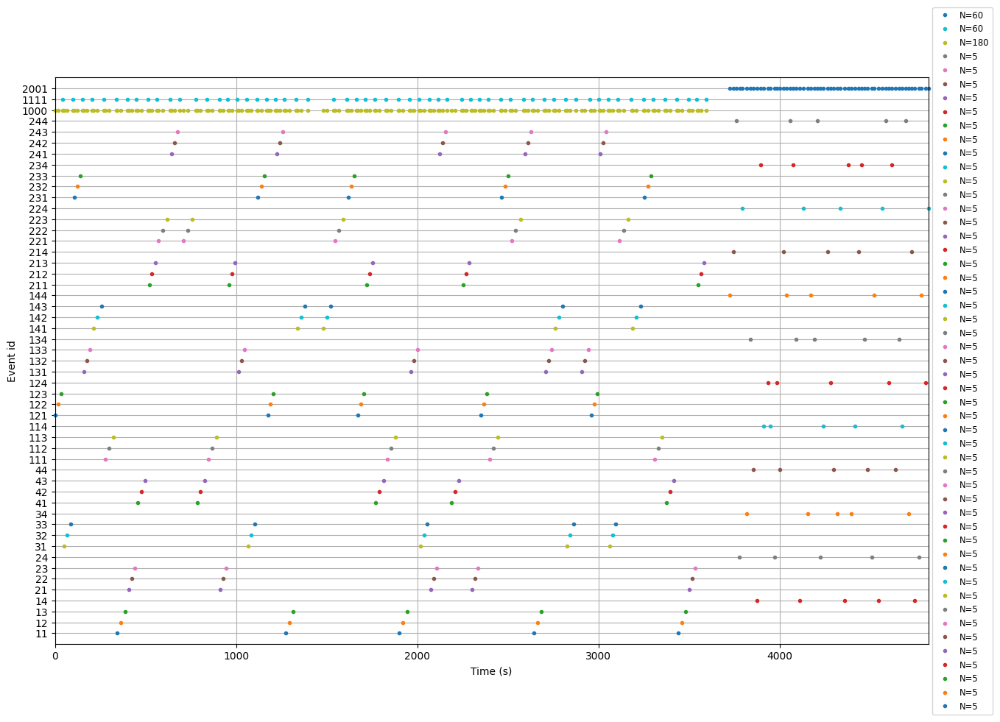

In [23]:
plt.figure(figsize=(17,10))
axes = plt.gca()
_ = mne.viz.plot_events(events, raw.info['sfreq'], raw.first_samp, axes=axes)

# Preprocessing

## Interpolate Bad Channels

In [3]:
raw.info['bads']

['P8', 'P10', 'T8']

In [4]:
raw.info

<Info | 11 non-empty values
 bads: 3 items (P8, P10, T8)
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG, 4 EOG, 1 Stimulus
 custom_ref_applied: True
 file_id: 4 items (dict)
 highpass: 0.0 Hz
 lowpass: 104.0 Hz
 meas_date: 2015-01-28 17:39:57 UTC
 meas_id: 4 items (dict)
 nchan: 69
 projs: []
 sfreq: 512.0 Hz
>

In [3]:
raw.interpolate_bads(origin=(0.0, 0.0, 0.0))

Interpolating bad channels
Computing interpolation matrix from 61 sensor positions
Interpolating 3 sensors


<Raw | P01-raw.fif, 69 x 2478166 (4840.2 s), ~1.27 GB, data loaded>

## Check PSD and Channels

Effective window size : 0.500 (s)


/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


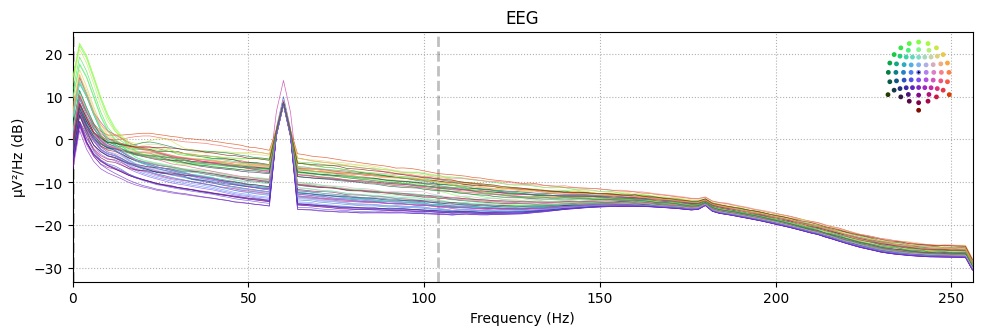

In [32]:
raw.compute_psd().plot()

Effective window size : 0.500 (s)


/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


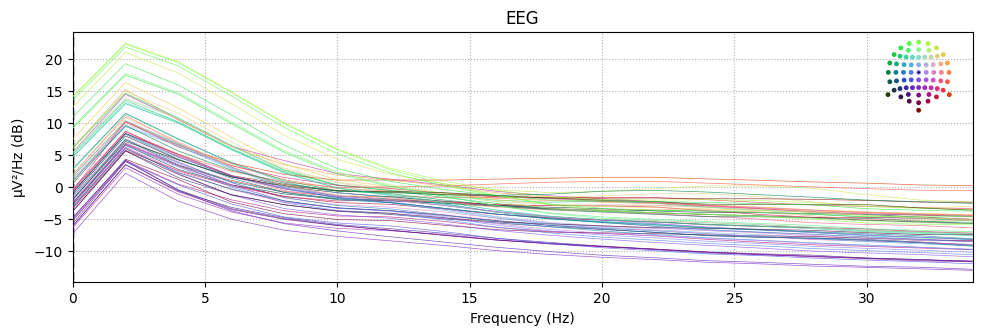

In [33]:
raw.compute_psd(fmax=35).plot()

In [21]:
def check_channel(raw, ch_num):
    ## have a look at 1st channel
    channel = raw[ch_num,:][0].squeeze()
    print(channel.shape)
    plt.figure(figsize=(17,4))
    a = plt.plot(channel)
    plt.show()

## Bandpass Filtering

In [4]:
eeg_picks = mne.pick_types(raw.info, meg=False, eeg=True, eog=False, stim=False, exclude=[])
fmin = 1
fmax = 30
raw.filter(fmin, fmax, picks=eeg_picks, filter_length='10s',
           l_trans_bandwidth=0.1, h_trans_bandwidth=0.5, method='iir',
           n_jobs=4, verbose=True)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 30.00 Hz: -6.02, -6.02 dB



/tmp/ipykernel_2395048/1660261365.py:4: RuntimeWarning: joblib not installed. Cannot run in parallel.
  raw.filter(fmin, fmax, picks=eeg_picks, filter_length='10s',


<Raw | P01-raw.fif, 69 x 2478166 (4840.2 s), ~1.27 GB, data loaded>

In [5]:
check_channel(raw, 0)

NameError: name 'check_channel' is not defined

Effective window size : 0.500 (s)


/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


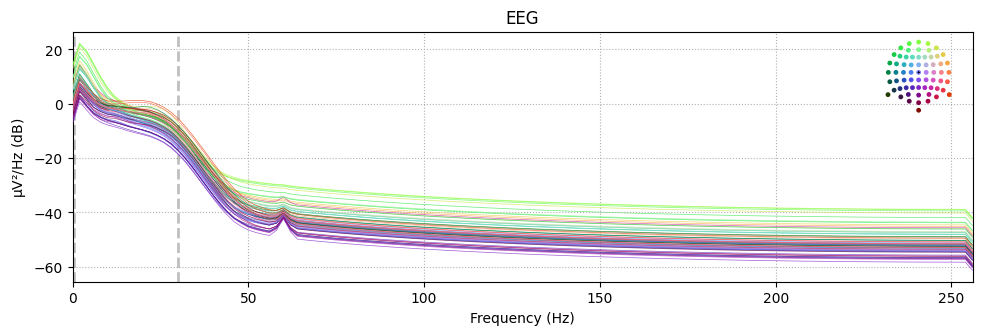

In [47]:
raw.compute_psd().plot()

Effective window size : 0.500 (s)


/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


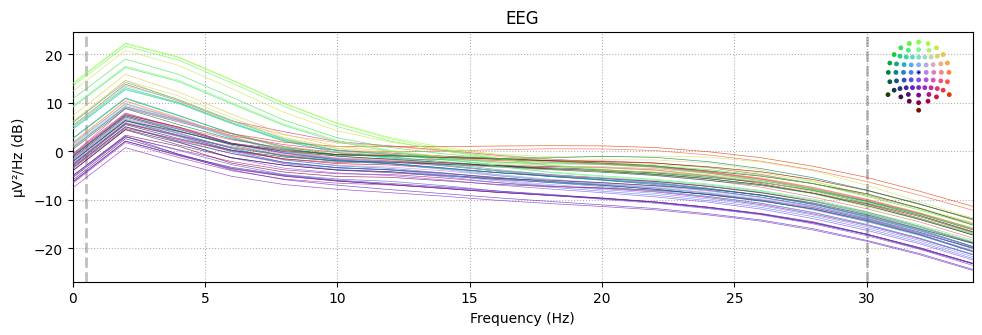

In [48]:
raw.compute_psd(fmax=35).plot()

### Helper Function

In [9]:
import os
import mne
import openpyxl
import numpy as np
import matplotlib.pyplot as plt

DEFAULT_VERSION = 1
CONDITIONS = ['cued', 'non-cued', 'free']
STIMULUS_IDS = [1, 2, 3, 4, 11, 12, 13, 14, 21, 22, 23, 24]

def load_stimuli_metadata(data_root=None, version=None, verbose=None):

    if version is None:
        version = DEFAULT_VERSION

    if data_root is None:
        data_root = os.path.join(deepthought.DATA_PATH, 'OpenMIIR')

    xlsx_filepath = os.path.join(data_root, 'meta', 'Stimuli_Meta.v{}.xlsx'.format(version))
    book = openpyxl.load_workbook(xlsx_filepath, data_only=True)
    sheet = book.worksheets[0]

    if verbose:
        log.info('Loading stimulus metadata from {}'.format(xlsx_filepath))

    meta = dict()
    for i in range(2, 14):
        stimulus_id = int(sheet.cell(i, 1).value)
        meta[stimulus_id] = {
            'id' : stimulus_id,
            'label' : sheet.cell(i,2).value,
            'audio_file' : sheet.cell(i,3).value,
            'cue_file' : sheet.cell(i,3).value.replace('.wav', '_cue.wav'),
            'length_with_cue' : sheet.cell(i,4).value,
            'length_of_cue' : sheet.cell(i,5).value,
            'length_without_cue' : sheet.cell(i,6).value,
            'length_of_cue_only' : sheet.cell(i,7).value,
            'cue_bpm' : int(sheet.cell(i,8).value),
            'beats_per_bar' : int(sheet.cell(i,9).value),
            'num_bars' : int(sheet.cell(i,15).value),
            'cue_bars' : int(sheet.cell(i,16).value),
            'bpm' : int(sheet.cell(i,17).value),
            'approx_bar_length' : sheet.cell(i,12).value,
        }

        if version == 2:
            meta[stimulus_id]['bpm'] = meta[stimulus_id]['cue_bpm'] # use cue bpm

    return meta

def load_beat_times(stimulus_id, cue=False, data_root=None, verbose=None, version=None):

    if version is None:
        version = DEFAULT_VERSION

    if data_root is None:
        data_root = os.path.join(deepthought.DATA_PATH, 'OpenMIIR')

    if cue:
        beats_filepath = os.path.join(data_root, 'meta',
                                      'beats.v{}'.format(version),
                                      '{}_cue_beats.txt'.format(stimulus_id))
    else:
        beats_filepath = os.path.join(data_root, 'meta',
                                      'beats.v{}'.format(version),
                                      '{}_beats.txt'.format(stimulus_id))

    with open(beats_filepath, 'r') as f:
        lines = f.readlines()

    beats = []
    for line in lines:
        if not line.strip().startswith('#'):
            beats.append(float(line.strip()))
    beats = np.asarray(beats)

    if verbose:
        print('Read {} beat times from {}'.format(len(beats), beats_filepath))

    return beats

def load_stimuli_metadata_map(key=None, data_root=None, verbose=None, version=None):

    if version is None:
        version = DEFAULT_VERSION

    # handle special case for beats
    if key == 'cue_beats':
        key = 'beats'
        cue = True
    else:
        cue = False

    if key == 'beats':
        map = dict()
        for stimulus_id in STIMULUS_IDS:
            map[stimulus_id] = load_beat_times(stimulus_id,
                                               cue=cue,
                                               data_root=data_root,
                                               verbose=None,
                                               version=version)
        return map

    meta = load_stimuli_metadata(data_root, version=version)

    if key is None:
        return meta  # return everything

    map = dict()
    for stimulus_id in STIMULUS_IDS:
        map[stimulus_id] = meta[stimulus_id][key]

    return map

def beat_event_id_generator(stimulus_id, condition, cue, beat_count):
    if cue:
        cue = 0
    else:
        cue = 10
    return 100000 + stimulus_id * 1000 + condition * 100 + cue + beat_count


        
def decode_event_id(event_id):
    if event_id < 1000:
        stimulus_id = int(event_id / 10)
        condition = int(event_id % 10)
        return stimulus_id, condition
    else:
        return event_id
    
def generate_beat_events(raw, trial_events):
    meta = load_stimuli_metadata(data_root="./openmiir")
    beats = load_stimuli_metadata_map(data_root="./openmiir", key='beats')
    cue_beats = load_stimuli_metadata_map(data_root="./openmiir", key='cue_beats')

    ## determine the number of cue beats
    num_cue_beats = dict()
    for stimulus_id in STIMULUS_IDS:
        num_cue_beats[stimulus_id] = \
            meta[stimulus_id]['beats_per_bar'] * meta[stimulus_id]['cue_bars']
    print(num_cue_beats)
    
    beat_events = []
    
    ## helper function to add a single beat event
    def add_beat_event(etime, stimulus_id, condition, beat_count, cue=False):
        etype = beat_event_id_generator(stimulus_id, condition, cue, beat_count)
        beat_events.append([etime, 0, etype])
        # print(beat_events[-1])

    ## helper function to add a batch of beat events
    def add_beat_events(etimes, stimulus_id, condition, cue=False):
        beats_per_bar = meta[stimulus_id]['beats_per_bar']
        for i, etime in enumerate(etimes):
            beat_count = (i % beats_per_bar) + 1
            add_beat_event(etime, stimulus_id, condition, beat_count, cue)

    use_audio_onset = True
    include_cue_beats = True
    sr = raw.info['sfreq']
    for i, event in enumerate(trial_events):
        etype = event[2]
        etime = event[0]

        # print('{:4d} at {:8d}'.format(etype, etime))

        if etype >= 1000: # stimulus_id + condition
            continue

        stimulus_id, condition = decode_event_id(etype)

        trial_start = etime # default: use trial onset
        if use_audio_onset and condition < 3:
            # Note: conditions 3 and 4 have no audio cues
            next_event = trial_events[i+1]
            if next_event[2] == 1000: # only use if audio onset
                trial_start = next_event[0]

        # print('Trial start at {}'.format(trial_start))
        print(stimulus_id, condition)
        if condition < 3: # cued
            offset = sr * meta[stimulus_id]['length_of_cue']

            if include_cue_beats:
                cue_beat_times = trial_start + np.floor(sr * cue_beats[stimulus_id])
                cue_beat_times = cue_beat_times[:num_cue_beats[stimulus_id]]  # truncate at num_cue_beats
                cue_beat_times = np.asarray(cue_beat_times, dtype=int)
                # print(cue_beat_times)
                add_beat_events(cue_beat_times, stimulus_id, condition, cue=True)
        else:
            offset = 0 # no cue

        beat_times = trial_start + offset + np.floor(sr * beats[stimulus_id])
        beat_times = np.asarray(beat_times, dtype=int)
        # print(beat_times[:5], '...')
        add_beat_events(beat_times, stimulus_id, condition)

    beat_events = np.asarray(beat_events, dtype=int)
    return beat_events

## aux function to score EEG channels by EOG correlation
def find_eog_artifact_sources(ica, raw, plot=True, verbose=None):

    eog_picks = mne.pick_types(raw.info, meg=False, eeg=False, eog=True, stim=False)
    eog_inds_set = set()
    multi_scores = list()
    for ch in eog_picks:
        ch_name = raw.ch_names[ch]
        eog_inds, scores = ica.find_bads_eog(raw, str(ch_name), verbose=verbose)
    #     print eog_inds, scores
        if plot:
            ica.plot_scores(scores, exclude=eog_inds, title='EOG artifact sources (red) for channel {}'.format(ch_name))

        multi_scores.append(scores)
        eog_inds_set.update(eog_inds)
    multi_scores = np.vstack(multi_scores)
    # print multi_scores.shape

    # IMPORTANT: due to a + operation meant to concatenate lists, ica.excluded and eog_inds must be lists, not ndarrays
    # see _pick_sources() in ica.py, line 1160
    eog_inds = list(eog_inds_set)
    scores = np.max(np.abs(multi_scores), axis=0).squeeze()

    print('suggested EOG artifact channels: ', eog_inds)
    print('EOG artifact component scores: ', scores[eog_inds])
    return eog_inds, scores
    
    # self.merge_artifact_components() # update 
    
## aux function for readable one-liner code in notebook
def merge_artifact_components(eog_exclude_inds=None, audo_exclude_inds=None):

    sets = list()
    if eog_exclude_inds:
        sets.append(eog_exclude_inds)
    if auto_exclude_inds:
        sets.append(auto_exclude_inds)

    if len(sets) == 1:
        merged = sets[0]
    else:
        print('merging', sets)
        merged = set()
        for s in sets:
            for e in s:
                merged.add(e)
        merged = sorted(list(merged))
    return merged

    # self.suggested_artifact_components = merged
    
def auto_detect_artifact_components(ica, beat_epochs, eog_exclude_inds):

    data = beat_epochs

    """
    data: raw, epochs or evoked
    """

    exclude_old = ica.exclude  # store old setting
    ica.exclude = []
    ica.detect_artifacts(data)
    auto_exclude = ica.exclude
    ica.exclude = exclude_old  # restore old setting

    suggested_artifact_components = merge_artifact_components(eog_exclude_inds=eog_exclude_inds, auto_exclude_indx=auto_exclude) # update combination
    return suggested_artifact_components

## Beat and EOG Epoching

In [5]:
trial_events = mne.find_events(raw, stim_channel='STI 014', shortest_event=0)

540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


In [10]:
# beat_events
beat_events = generate_beat_events(raw, trial_events)

{1: 6, 2: 6, 3: 8, 4: 8, 11: 6, 12: 6, 13: 8, 14: 8, 21: 6, 22: 6, 23: 4, 24: 8}
12 1
12 2
12 3
3 1
3 2
3 3
23 1
23 2
23 3
13 1
13 2
13 3
14 1
14 2
14 3
11 1
11 2
11 3
1 1
1 2
1 3
2 1
2 2
2 3
4 1
4 2
4 3
21 1
21 2
21 3
22 1
22 2
22 3
24 1
24 2
24 3
22 1
22 2
22 3
4 1
4 2
4 3
11 1
11 2
11 3
2 1
2 2
2 3
21 1
21 2
21 3
13 1
13 2
13 3
3 1
3 2
3 3
23 1
23 2
23 3
12 1
12 2
12 3
24 1
24 2
24 3
1 1
1 2
1 3
14 1
14 2
14 3
14 1
14 2
14 3
22 1
22 2
22 3
23 1
23 2
23 3
12 1
12 2
12 3
21 1
21 2
21 3
4 1
4 2
4 3
11 1
11 2
11 3
1 1
1 2
1 3
13 1
13 2
13 3
3 1
3 2
3 3
2 1
2 2
2 3
24 1
24 2
24 3
4 1
4 2
4 3
21 1
21 2
21 3
2 1
2 2
2 3
12 1
12 2
12 3
11 1
11 2
11 3
23 1
23 2
23 3
22 1
22 2
22 3
24 1
24 2
24 3
1 1
1 2
1 3
13 1
13 2
13 3
14 1
14 2
14 3
3 1
3 2
3 3
13 1
13 2
13 3
12 1
12 2
12 3
24 1
24 2
24 3
3 1
3 2
3 3
22 1
22 2
22 3
14 1
14 2
14 3
23 1
23 2
23 3
11 1
11 2
11 3
4 1
4 2
4 3
1 1
1 2
1 3
2 1
2 2
2 3
21 1
21 2
21 3
14 4
21 4
24 4
2 4
22 4
3 4
13 4
4 4
1 4
23 4
11 4
12 4
11 4
2 4
12 4
4 4
21 4


/home/wazenmai/Experiment/bci/bci_env/lib/python3.8/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


In [11]:
beat_events

array([[    524,       0,  112101],
       [    689,       0,  112102],
       [    854,       0,  112103],
       ...,
       [2475509,       0,  122413],
       [2475718,       0,  122411],
       [2475889,       0,  122412]])

In [12]:
picks = mne.pick_types(raw.info, meg=False, eeg=True, eog=True, stim=True, exclude=[])
event_id = None # any
tmin = -0.2  # start of each epoch (200ms before the trigger)
tmax = 0.8  # end of each epoch (600ms after the trigger) - longest beat is 0.57s long
detrend = 0 # remove dc
beat_epochs = mne.Epochs(raw, beat_events, event_id,
                              tmin, tmax, preload=True,
                              proj=False, picks=picks, verbose=False)
print(beat_epochs)

<Epochs |  8140 events (all good), -0.199219 - 0.800781 sec, baseline -0.199219 – 0 sec, ~2.15 GB, data loaded,
 '101101': 10
 '101102': 10
 '101103': 10
 '101111': 80
 '101112': 80
 '101113': 75
 '101201': 10
 '101202': 10
 '101203': 10
 '101211': 80
 and 242 more events ...>


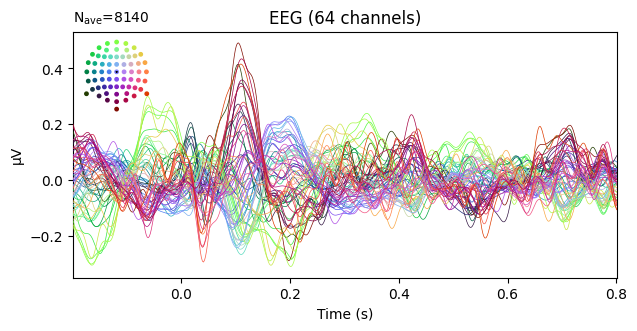

In [13]:
a = beat_epochs.average().plot()

In [12]:
# Find EOG epochs

eog_event_id = 5000
eog_events = mne.preprocessing.find_eog_events(raw, eog_event_id)

Using EOG channels: EXG1, EXG2, EXG3, EXG4
EOG channel index for this subject is: [64 65 66 67]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)

Now detecting blinks and generating corresponding events
Found 1579 significant peaks
Number of EOG events detected: 1579


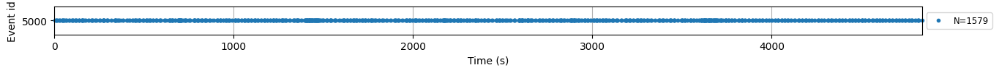

In [13]:
plt.figure(figsize=(17,0.5))
axes = plt.gca()
mne.viz.plot_events(eog_events, raw.info['sfreq'], raw.first_samp, axes=axes)

# create epochs around EOG events
picks = mne.pick_types(raw.info, meg=False, eeg=True, eog=True, stim=True, exclude=[]) # FIXME
tmin = -.5
tmax = .5
eog_epochs = mne.Epochs(raw, events=eog_events, event_id=eog_event_id,
                    tmin=tmin, tmax=tmax, proj=False, picks=picks,
                    preload=True, verbose=False)

# Total 1579 eye blinksb

## ICA

In [14]:
def compute_ica(raw, beat_epochs, random_seed=42):
    random_state = np.random.RandomState(random_seed)
    ica = mne.preprocessing.ICA(n_components=0.99, method='infomax', fit_params=dict(extended=True), random_state=random_state)
    ica.fit(raw)
    # ica.fit(beat_epochs)
    return ica
ica = compute_ica(beat_epochs)

Fitting ICA to data using 64 channels (please be patient, this may take a while)


/tmp/ipykernel_2369076/1066931528.py:4: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica.fit(beat_epochs)


Selecting by explained variance: 48 components
Computing Extended Infomax ICA
Fitting ICA took 2194.4s.


In [15]:
 ## aux functions to be moved to lib
def plot_ica_components(ica, picks=None, topomap_size=3.5):

    if picks is None:
        n_components = ica.mixing_matrix_.shape[1]
        picks = list(range(n_components))
    if len(picks) == 0:
        print('nothing selected for plotting')
        return
    ica.plot_components(picks=picks, ch_type='eeg', title='', colorbar=True, show=False)
    axes = plt.gcf()
    axes.set_size_inches(min(len(picks), 5) * topomap_size, max(len(picks)/5.0, 1) * topomap_size)
    plt.show()

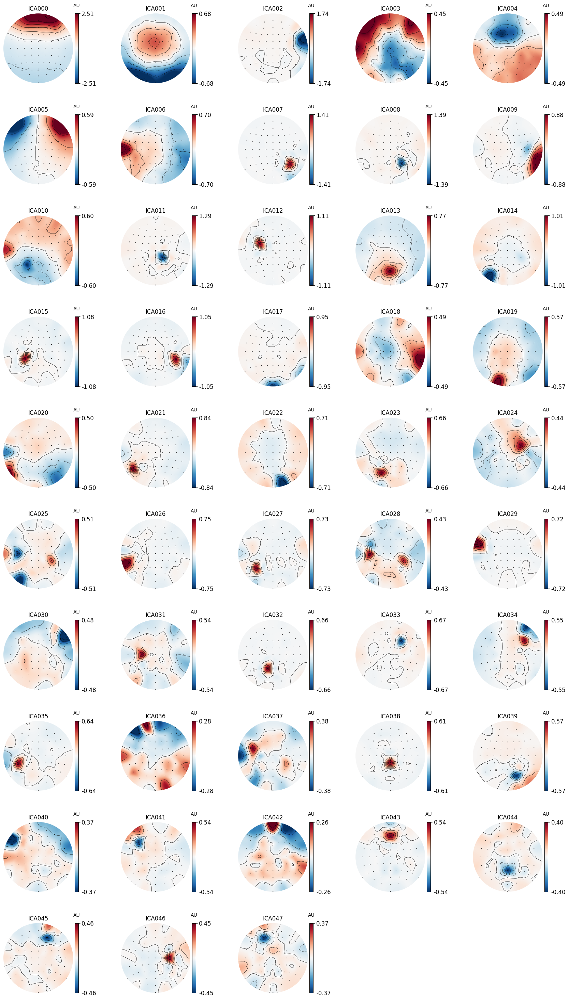

In [16]:
plot_ica_components(ica)

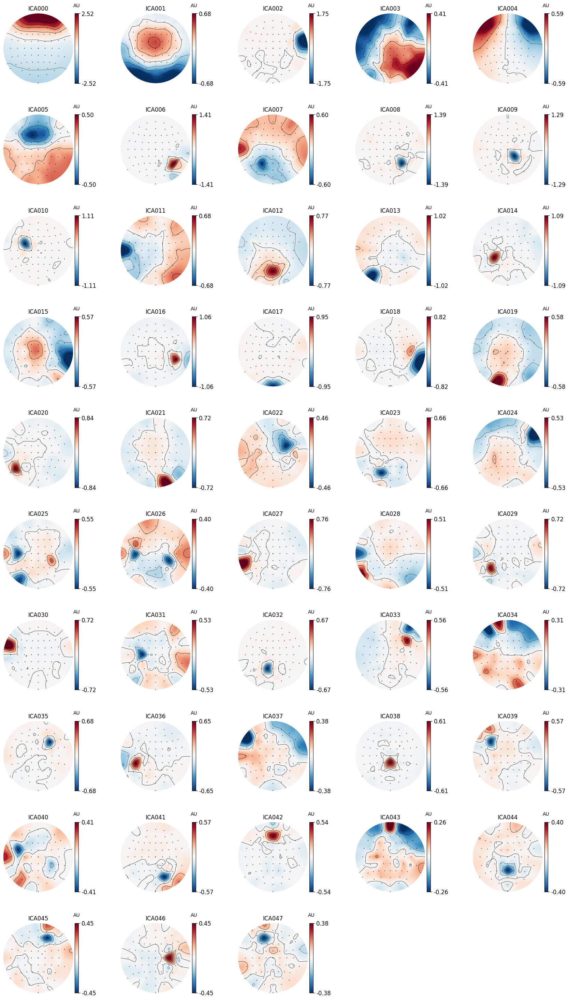

In [47]:
plot_ica_components(ica)

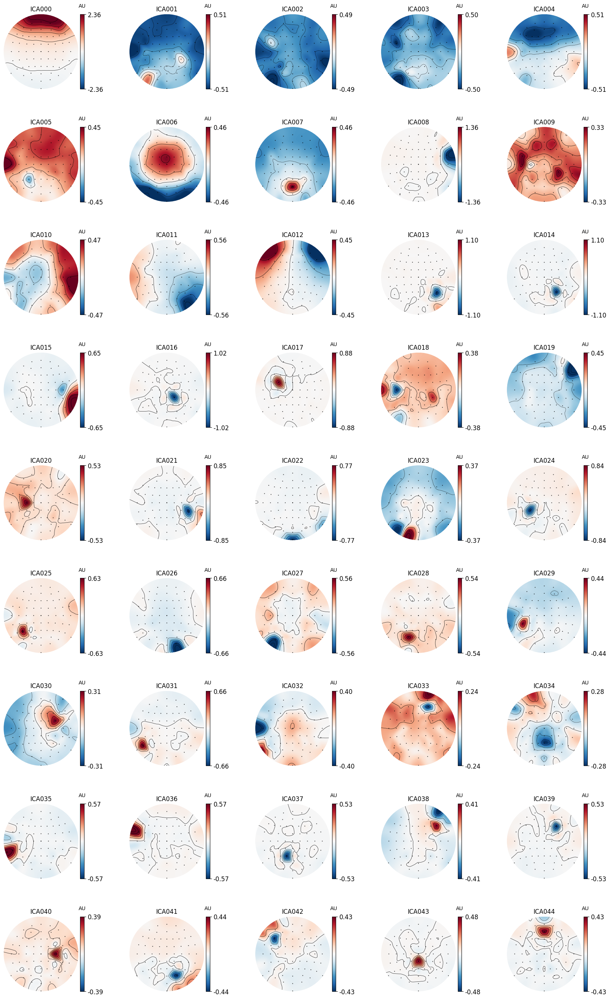

In [169]:
plot_ica_components(ica)

In [48]:
def inspect_source_psd(beat_epochs, ica, ic):
    data = beat_epochs
    source = ica._transform_epochs(data, concatenate=True)[ic]
    sfreq = data.info['sfreq']
    plt.figure()
    plt.psd(source, Fs=sfreq, NFFT=128, noverlap=0, pad_to=None)
    plt.show()

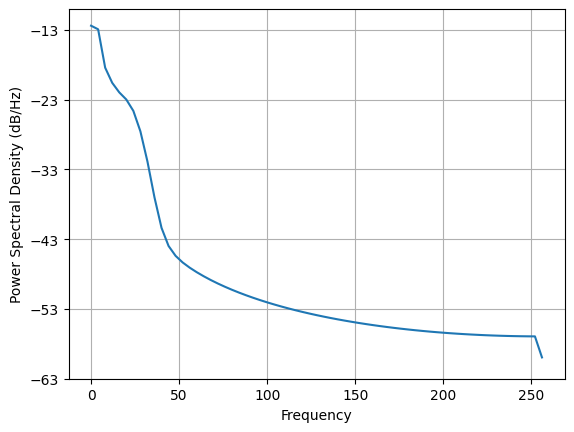

In [49]:
inspect_source_psd(beat_epochs, ica, 1) # plot the PSD of an IC source to look for alpha activity

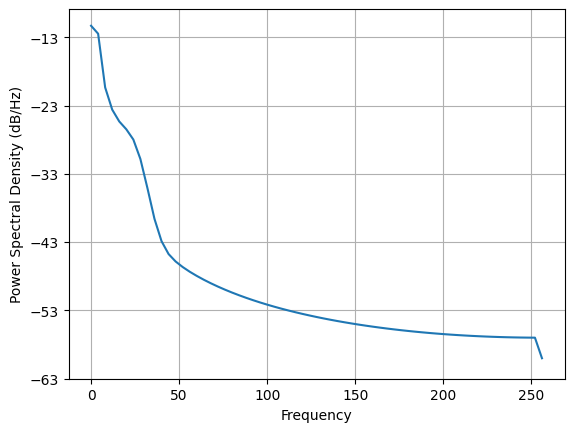

In [50]:
inspect_source_psd(beat_epochs, ica, 2)

In [51]:
# find eog artifact sources
ica

Method,infomax
Fit,500 iterations on epochs (4175820 samples)
ICA components,48
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,—


In [174]:
ica.save("p01-ica.fif")

Writing ICA solution to /Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/p01-ica.fif...


Method,infomax
Fit,500 iterations on epochs (4175820 samples)
ICA components,45
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


Using EOG channel: EXG1
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


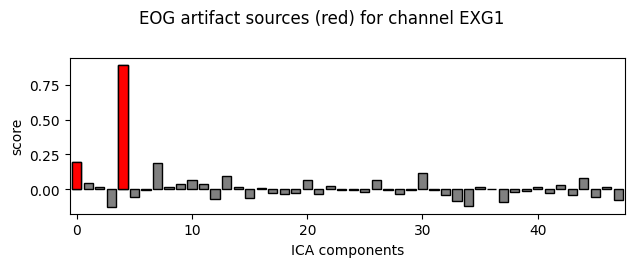

Using EOG channel: EXG2
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.4s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


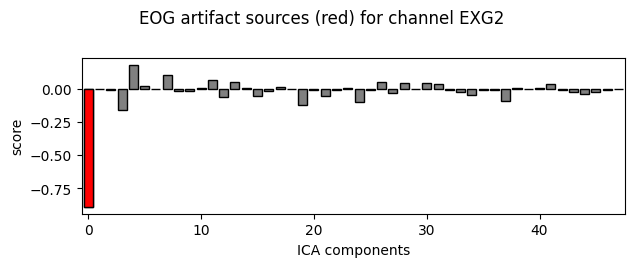

Using EOG channel: EXG3
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


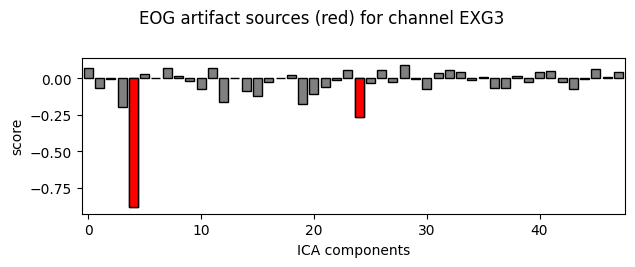

Using EOG channel: EXG4
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


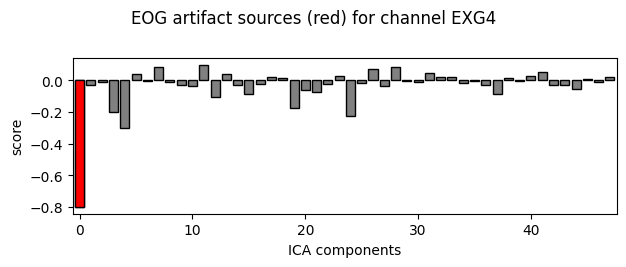

suggested EOG artifact channels:  [0, 24, 4]
EOG artifact component scores:  [0.89025774 0.26423649 0.89300838]


In [52]:
eog_inds, scores = find_eog_artifact_sources(ica, raw)

Using EOG channel: EXG1
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


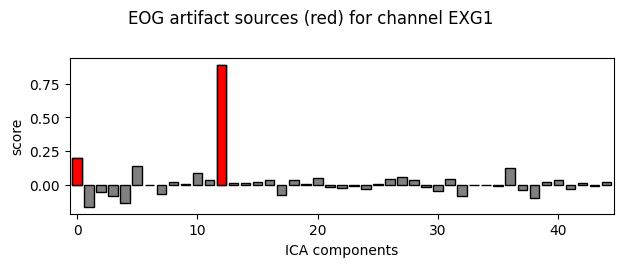

Using EOG channel: EXG2
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


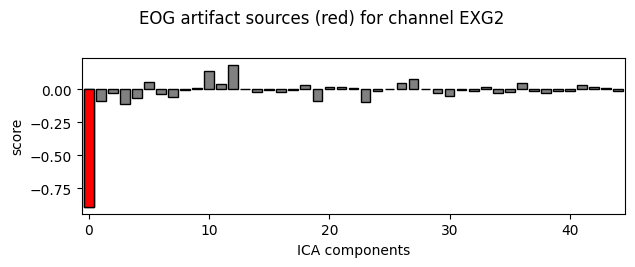

Using EOG channel: EXG3
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


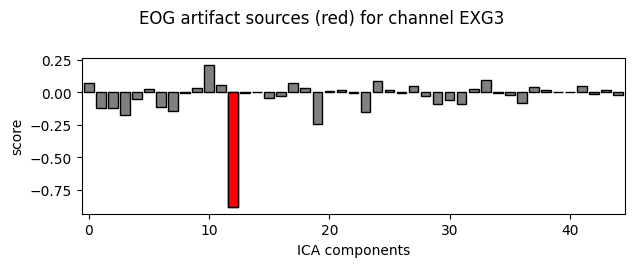

Using EOG channel: EXG4
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.4s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


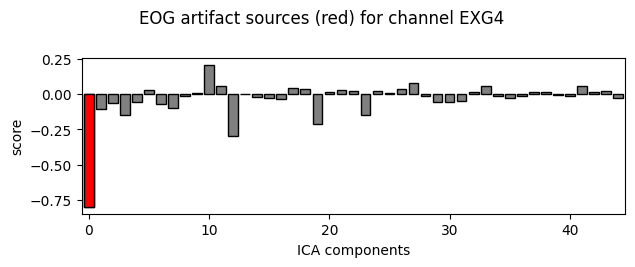

suggested EOG artifact channels:  [0, 12]
EOG artifact component scores:  [0.8903061  0.89264824]


In [180]:
eog_inds, scores = find_eog_artifact_sources(ica, raw)

In [53]:
ica.find_bads_eog(beat_epochs)

Using EOG channels: EXG1, EXG2, EXG3, EXG4


([0, 4],
 [array([ 0.17896224, -0.02942337,  0.01753035, -0.22231464,  0.32993371,
         -0.03277139, -0.00751574,  0.19127173,  0.01026993,  0.01348559,
          0.00766307,  0.03078752, -0.17409209,  0.07194643, -0.03951064,
         -0.09583856, -0.01610693, -0.02558495, -0.00339554, -0.12616076,
         -0.01076212, -0.04470768,  0.01312182,  0.04920739, -0.14309411,
         -0.04596187,  0.07493058, -0.00768185,  0.03866781,  0.00164618,
          0.03593262,  0.00652555,  0.010781  , -0.02787125, -0.08356075,
          0.01693434, -0.02832197, -0.10822174, -0.01742285, -0.02633635,
          0.00543678,  0.02982606,  0.00720208, -0.05908071,  0.06837962,
          0.00310662,  0.00716552, -0.00607665]),
  array([-7.18296011e-01, -1.36904287e-02,  4.81501108e-03, -1.14844061e-01,
          1.08937644e-01, -2.26869505e-02, -6.16712922e-03,  1.13177269e-01,
          4.25599933e-03,  1.07832542e-02,  1.86038195e-03,  2.76063623e-02,
         -1.15825539e-01,  4.57352131e-02, -

In [191]:
ica.find_bads_eog(beat_epochs)

Using EOG channels: EXG1, EXG2, EXG3, EXG4


([0, 12],
 [array([ 0.18109254, -0.22607523, -0.14133155, -0.20010973, -0.13528343,
          0.13401101, -0.10261786, -0.14386886,  0.01692676,  0.07226772,
          0.13609586,  0.03936862,  0.33262805,  0.01088717, -0.0122344 ,
         -0.01558906,  0.00692016, -0.00728688,  0.04343219, -0.12964699,
          0.06144197,  0.00607358, -0.02824961, -0.09322764,  0.02141981,
          0.0332075 ,  0.00464467,  0.07563346,  0.01925706, -0.06171415,
         -0.08199371, -0.01754476, -0.02742654,  0.06024945, -0.01945199,
         -0.01451664,  0.04064917, -0.00177453, -0.04365358,  0.00947241,
          0.01281616,  0.01472608, -0.00950766, -0.00624756, -0.00080057]),
  array([-7.16717045e-01, -1.41897612e-01, -8.53768548e-02, -1.15249824e-01,
         -9.28372095e-02,  8.40310732e-02, -6.16740141e-02, -9.82895826e-02,
          5.29414860e-03,  4.75931046e-02,  1.00980708e-01,  1.59053936e-02,
          1.11105607e-01,  8.29929113e-03, -9.54572954e-03, -6.50686491e-03,
          6.52

In [54]:
ica.exclude = [0, 4]
ica

Method,infomax
Fit,500 iterations on epochs (4175820 samples)
ICA components,48
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,ICA000ICA004


In [228]:
ica.save('P01-ica.fif', overwrite=True)

Overwriting existing file.
Writing ICA solution to /Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/P01-ica.fif...


Method,infomax
Fit,500 iterations on epochs (4175820 samples)
ICA components,45
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,ICA000ICA012


### ICA Labeling

In [18]:
from mne_icalabel import label_components
raw.set_montage('biosemi64')
ans = label_components(raw, ica, method='iclabel')

/tmp/ipykernel_2369076/1961851572.py:3: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ans = label_components(raw, ica, method='iclabel')


In [23]:
d = {}
for label in ans["labels"]:
    if label not in d:
        d[label] = 1
    else:
        d[label] += 1
print(d)

{'eye blink': 2, 'brain': 13, 'channel noise': 13, 'other': 18, 'muscle artifact': 2}


# ASR

In [14]:
from asrpy.asrpy import ASR

In [15]:
asr = ASR(sfreq=raw.info["sfreq"], cutoff=20)

In [ ]:
asr.fit(raw)

In [ ]:
asr_raw = asr.transform(raw)

In [ ]:
picks = mne.pick_types(asr_raw.info, meg=False, eeg=True, eog=True, stim=True, exclude=[])
event_id = None # any
tmin = -0.2  # start of each epoch (200ms before the trigger)
tmax = 0.8  # end of each epoch (600ms after the trigger) - longest beat is 0.57s long
detrend = 0 # remove dc
clean_beat_epochs = mne.Epochs(asr_raw, beat_events, event_id,
                              tmin, tmax, preload=True,
                              proj=False, picks=picks, verbose=False)
clean_beat_epochs.average().plot()

In [ ]:
clean_beat_epochs.save('P01-epo.fif')

In [10]:
ica = mne.preprocessing.read_ica('P01-ica.fif')

Reading P01-ica.fif ...
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
Now restoring ICA solution ...
Ready.


In [ ]:
ica.info

# Experiment 1

In [39]:
eog_event_id = 5000
eog_events = mne.preprocessing.find_eog_events(raw, eog_event_id)
# raw.add_events(eog_events, "STI 014")

Using EOG channels: EXG1, EXG2, EXG3, EXG4
EOG channel index for this subject is: [64 65 66 67]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)

Now detecting blinks and generating corresponding events
Found 1579 significant peaks
Number of EOG events detected: 1579


In [3]:
events = mne.find_events(raw, "STI 014")

540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


In [35]:
picks = mne.pick_types(raw.info, meg=False, eeg=False, stim=True, eog=False)
picks

array([68])

In [47]:
tmin, tmax = -0.2, 0.5
# event_ids = {"AudL": 1, "AudR": 2, "VisL": 3, "VisR": 4}
epochs = mne.Epochs(raw, eog_events, None, tmin, tmax, picks=picks)

Not setting metadata
1579 matching events found
Setting baseline interval to [-0.19921875, 0.0] sec
Applying baseline correction (mode: mean)
1 projection items activated


In [51]:
epochs.get_data()

Loading data for 1579 events and 359 original time points ...


array([[[0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.]]])

In [40]:
# Get the stim channel data
# pick_ch = mne.pick_channels(epochs.ch_names, ["STI 014"])[0]
data = epochs.get_data()[:, pick_ch, :]
data = np.sum((data.astype(int) & eog_event_id) == eog_event_id, axis=0)

Loading data for 540 events and 359 original time points ...
0 bad epochs dropped


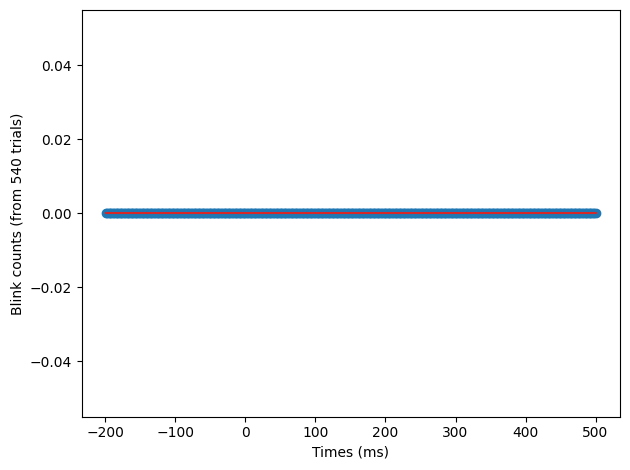

In [43]:
fig, ax = plt.subplots()
ax.stem(1e3 * epochs.times, data)
ax.set(xlabel="Times (ms)", ylabel="Blink counts (from %s trials)" % len(epochs))
fig.tight_layout()

In [46]:
epochs.get_data().shape

Loading data for 540 events and 359 original time points ...


(540, 1, 359)

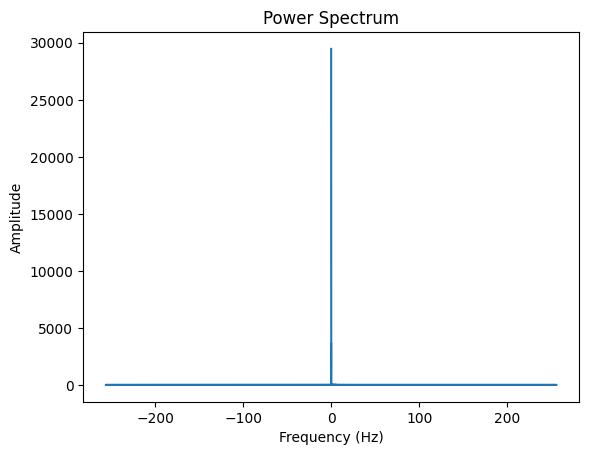

In [60]:
channel_name = "EXG1"
eeg_data = raw.get_data(picks=channel_name)

n_samples = eeg_data.shape[1]
sampling_freq = raw.info['sfreq']
freq_data = np.fft.fft(eeg_data)
freq_values = np.fft.fftfreq(n_samples, 1 / sampling_freq)

plt.plot(freq_values, np.squeeze(np.abs(freq_data)))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title('Power Spectrum')
plt.show()

## FIR filter to suppress EOG artifacts

In [70]:
raw.get_data('eeg').shape

(64, 2478166)

In [66]:
from mne.filter import create_filter

eog_freq_range = (1, 30)  # Define the desired frequency range for the EOG artifacts

filter_order = int(raw.info['sfreq'] * 2)  # Filter order determined by the sampling frequency
fir_filter = create_filter(raw.get_data('eeg'), raw.info['sfreq'], 1, 50, filter_length='auto',
                           l_trans_bandwidth='auto', h_trans_bandwidth='auto', method='fir',
                           fir_window='hamming')


Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1691 samples (3.303 sec)



In [72]:
fir_filter.shape

(1691,)

In [67]:
filtered_data = fir_filter.apply(raw.get_data())
filtered_raw = mne.io.RawArray(filtered_data, raw.info)

AttributeError: 'numpy.ndarray' object has no attribute 'apply'

In [76]:
x = raw.get_data('Fp1')
x_v14 = np.convolve(fir_filter, np.squeeze(x))[len(fir_filter) // 2 :]

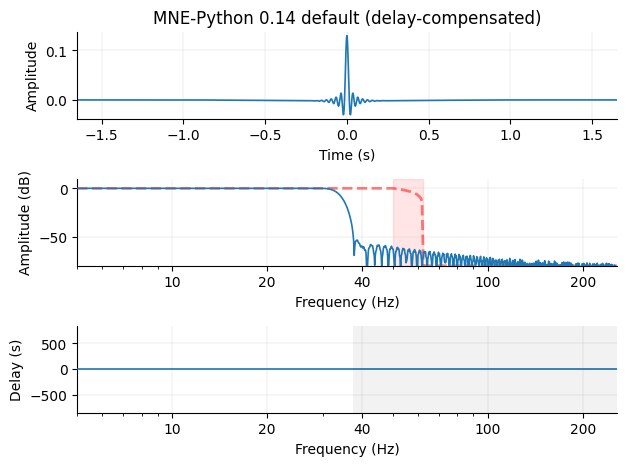

In [82]:
from mne.viz import plot_filter, plot_ideal_filter
f_p = 50
transition_band = 0.25 * f_p
f_s = f_p + transition_band
freq = [0.0, f_p, f_s, raw.info['sfreq'] / 2.0]
gain = [1.0, 1.0, 0.0, 0.0]

a = plot_filter(fir_filter, raw.info['sfreq'], freq, gain, "MNE-Python 0.14 default", compensate=True)

In [ ]:
axes = plt.subplots(1, 2)[1]

def plot_signal(x, offset, sfreq):
    """Plot a signal."""
    t = np.arange(len(x)) / sfreq
    axes[0].plot(t, x + offset)
    axes[0].set(xlabel="Time (s)", xlim=t[[0, -1]])
    X = fft(x)
    freqs = fftfreq(len(x), 1.0 / sfreq)
    mask = freqs >= 0
    X = X[mask]
    freqs = freqs[mask]
    axes[1].plot(freqs, 20 * np.log10(np.maximum(np.abs(X), 1e-16)))
    axes[1].set(xlim=flim)

yscale = 30
yticklabels = [
    "Original",
    "FIR-firwin2 (0.14)",
]
yticks = -np.arange(len(yticklabels)) / yscale
plot_signal(x, offset=yticks[1], sfreq=raw.info['sfreq'])
plot_signal(x_v14, offset=yticks[3], sfreq=raw.info['sfreq'])
axes[0].set(
    xlim=tlim,
    title="FIR, Lowpass=%d Hz" % f_p,
    xticks=tticks,
    ylim=[-len(yticks) / yscale, 1.0 / yscale],
    yticks=yticks,
    yticklabels=yticklabels,
)
for text in axes[0].get_yticklabels():
    text.set(rotation=45, size=8)
axes[1].set(xlim=flim, ylim=(-60, 10), xlabel="Frequency (Hz)", ylabel="Magnitude (dB)")
mne.viz.tight_layout()
plt.show()

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x121d399d0> (for post_execute):


KeyboardInterrupt: 

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import mne

# Load raw EEG data
# raw = mne.io.read_raw_edf('path_to_your_data.edf', preload=True)
raw = mne.io.read_raw_fif(dir_path + "P01-raw.fif")

# Define channel names
eeg_channels = raw.ch_names[:64]  # List of EEG channel names
eog_channels = raw.ch_names[64:68]  # List of EOG channel names
stim_channel = raw.ch_names[68]  # Stimulus channel name

# Locate EOG artifacts
eog_epochs = mne.preprocessing.create_eog_epochs(raw, reject_by_annotation=True)

# Apply bandpass filter to EEG data
orig_raw = raw
raw = raw.load_data()
raw.filter(1, 50, fir_design='firwin')


Opening raw data file ./OpenMIIR-RawEEG_v1/P01-raw.fif...
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
    Range : 0 ... 2478165 =      0.000 ...  4840.166 secs
Ready.
Using EOG channels: EXG1, EXG2, EXG3, EXG4
EOG channel index for this subject is: [64 65 66 67]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5120 samples (10.000 sec)

Now detecting blinks and generating corresponding events
Found 1579 significant peaks
Number of EOG events dete

<Raw | P01-raw.fif, 69 x 2478166 (4840.2 s), ~1.27 GB, data loaded>

Removing projector <Projection | Average EEG reference, active : False, n_channels : 64>
Applying baseline correction (mode: mean)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hann window with 0.0546 passband ripple and 44 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1589 samples (3.104 sec)

Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lowe

/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


Filtered data
Effective window size : 0.500 (s)


/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


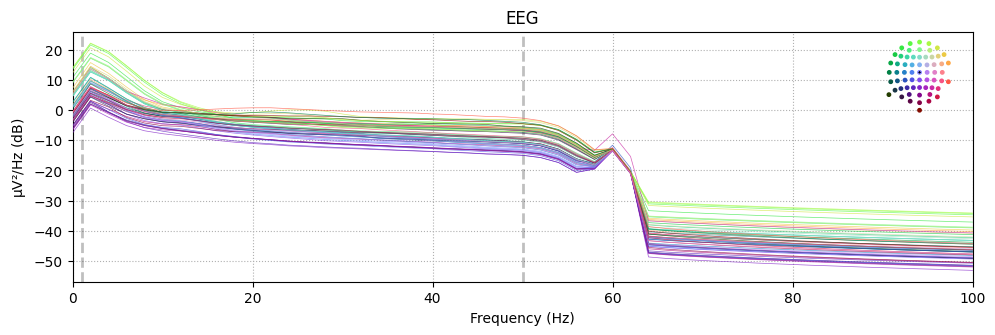

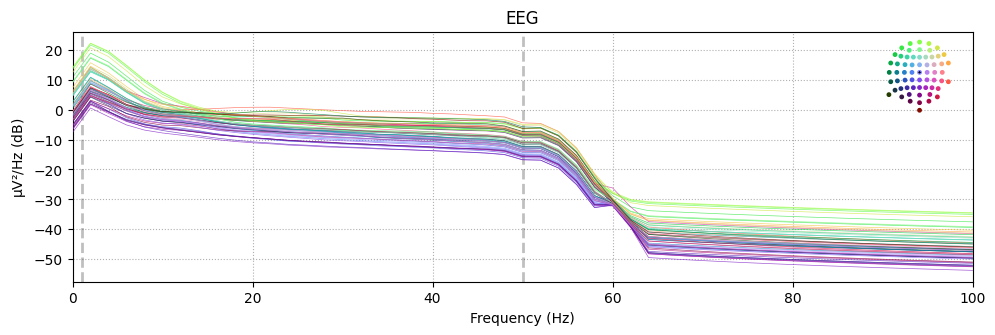

In [17]:
# Apply FIR filter to suppress EOG artifacts
eog_epochs.average().apply_baseline(baseline=(None, 0))  # Baseline correction for EOG epochs
eeg_cleaned = raw.copy().filter(1, 50, fir_window="hann")
eeg_cleaned = eeg_cleaned.notch_filter(freqs=50)  # Apply notch filter at 50 Hz to remove power line interference
eeg_cleaned = eeg_cleaned.apply_proj()  # Apply the projector to remove EOG artifacts

# Plot power spectrum of raw data
print("Raw data")
raw.compute_psd(fmax=100).plot()

# Plot power spectrum of filtered data
print("Filtered data")
eeg_cleaned.compute_psd(fmax=100).plot()

# Show the plots
plt.show()

# Exercise 2

In [3]:
import numpy as np

import matplotlib.pyplot as plt

import mne
from mne.io import concatenate_raws, read_raw_edf
from mne.datasets import sample, eegbci, ssvep
from mne.preprocessing import Xdawn

import asrpy
from autoreject import AutoReject
from pyriemann.clustering import Potato
import pyriemann

from sklearn.model_selection import cross_val_score, StratifiedShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from mne.decoding import CSP, Vectorizer

mne.utils.check_random_state(26042021)

RandomState(MT19937) at 0x129549C40

In [4]:
raw = mne.io.read_raw_fif(dir_path + "P01-raw.fif")
print(raw.info)

Opening raw data file ./OpenMIIR-RawEEG_v1/P01-raw.fif...
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
    Range : 0 ... 2478165 =      0.000 ...  4840.166 secs
Ready.
<Info | 11 non-empty values
 bads: 3 items (P8, P10, T8)
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG, 4 EOG, 1 Stimulus
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.0 Hz
 lowpass: 104.0 Hz
 meas_date: 2015-01-28 17:39:57 UTC
 meas_id: 4 items (dict)
 nchan: 69
 projs: Average EEG reference: off
 sfreq: 512.0 Hz
>


In [5]:
events = mne.find_events(raw, stim_channel='STI 014', shortest_event=0)
event_ids = np.unique(events[:, 2])

540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


In [6]:
event_id = {}
for id in event_ids:
    event_id[str(id)] = id
event_id

{'11': 11,
 '12': 12,
 '13': 13,
 '14': 14,
 '21': 21,
 '22': 22,
 '23': 23,
 '24': 24,
 '31': 31,
 '32': 32,
 '33': 33,
 '34': 34,
 '41': 41,
 '42': 42,
 '43': 43,
 '44': 44,
 '111': 111,
 '112': 112,
 '113': 113,
 '114': 114,
 '121': 121,
 '122': 122,
 '123': 123,
 '124': 124,
 '131': 131,
 '132': 132,
 '133': 133,
 '134': 134,
 '141': 141,
 '142': 142,
 '143': 143,
 '144': 144,
 '211': 211,
 '212': 212,
 '213': 213,
 '214': 214,
 '221': 221,
 '222': 222,
 '223': 223,
 '224': 224,
 '231': 231,
 '232': 232,
 '233': 233,
 '234': 234,
 '241': 241,
 '242': 242,
 '243': 243,
 '244': 244,
 '1000': 1000,
 '1111': 1111,
 '2001': 2001}

In [7]:
# pick only EEG channels (no MEG, EOG or other channels)
picks = mne.pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False)
raw.pick(picks)

# filter the data between 1 and 75 Hz
orig_raw = raw
raw = raw.load_data()
raw.filter(l_freq=1., h_freq=None, fir_design='firwin',
           skip_by_annotation='edge')


     

Removing projector <Projection | Average EEG reference, active : False, n_channels : 64>
Reading 0 ... 2478165  =      0.000 ...  4840.166 secs...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1691 samples (3.303 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:    7.7s finished


<Raw | P01-raw.fif, 61 x 2478166 (4840.2 s), ~1.13 GB, data loaded>

In [8]:
# set the start and end time of the epochs we want to investigate
tmin = -0.2
tmax = 1.5

# create epochs around the events we extracted from our data
epochs = mne.Epochs(raw, events, event_id, tmin, tmax,
                    baseline=None, reject=None,
                    verbose=False, detrend=0, preload=True)

In [9]:
epochs

Number of events,540
Events,1000: 18011: 5111: 51111: 60112: 5113: 5114: 512: 5121: 5122: 5123: 5124: 513: 5131: 5132: 5133: 5134: 514: 5141: 5142: 5143: 5144: 52001: 6021: 5211: 5212: 5213: 5214: 522: 5221: 5222: 5223: 5224: 523: 5231: 5232: 5233: 5234: 524: 5241: 5242: 5243: 5244: 531: 532: 533: 534: 541: 542: 543: 544: 5
Time range,-0.199 – 1.500 sec
Baseline,off


## AutoReject

In [20]:
# set parameters for autoreject
n_interpolates = np.array([1, 4, 32])
consensus_percs = np.linspace(0, 1.0, 11)
ar = AutoReject(n_interpolates, consensus_percs, random_state=26042021)

# fit the autoreject channel thresholds and bad epochs
ar.fit(epochs)

# transform the epochs, excluding/interpolating bad epochs
epochs_ar, reject_log = ar.transform(epochs, return_log=True)

Running autoreject on ch_type=eeg


/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|█████████████| Creating augmented epochs : 61/61 [00:05<00:00,   12.02it/s]
100%|██████████████| Computing thresholds ... : 61/61 [04:31<00:00,    4.45s/it]


  0%|                          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  1%|▏                     | Repairing epochs : 5/540 [00:00<00:01,  272.91it/s]

  2%|▎                     | Repairing epochs : 9/540 [00:00<00:02,  249.30it/s]

  2%|▌                    | Repairing epochs : 13/540 [00:00<00:02,  245.30it/s]

  3%|▋                    | Repairing epochs : 18/540 [00:00<00:02,  254.45it/s]

  4%|▊                    | Repairing epochs : 22/540 [00:00<00:02,  251.57it/s]

  5%|█                





Estimated consensus=0.90 and n_interpolate=32




  0%|                          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|                      | Repairing epochs : 2/540 [00:00<00:06,   82.98it/s]

  1%|▏                     | Repairing epochs : 4/540 [00:00<00:09,   53.94it/s]

  1%|▏                     | Repairing epochs : 5/540 [00:00<00:10,   53.09it/s]

  1%|▏                     | Repairing epochs : 6/540 [00:00<00:10,   48.90it/s]

  1%|▎                     | Repairing epochs : 7/540 [00:00<00:11,   46.95it/s]

  1%|▎                     | Repairing epochs : 8/540 [00:00<00:11,   47.38it/s]

  2%|▎                     | Repairing epochs : 9/540 [00:00<00:11,   47.99it/s]

  2%|▍                    | Repairing epochs : 10/540 [00:00<00:11,   47.76it/s]

  2%|▍                    | Repairing epochs : 12/540 [00:00<00:10,   51.80it/s]

  2%|▌                    | Repairing epochs : 13/540 [00:00<00:10,   50.25it/s]

  3%|▌                    | Repairing epochs : 14/540 [00:00<00:10,   48.58it/s]

  3%|▌        

Dropped 2 epochs: 341, 342


In [21]:
epochs_ar

Number of events,538
Events,1000: 17911: 5111: 51111: 59112: 5113: 5114: 512: 5121: 5122: 5123: 5124: 513: 5131: 5132: 5133: 5134: 514: 5141: 5142: 5143: 5144: 52001: 6021: 5211: 5212: 5213: 5214: 522: 5221: 5222: 5223: 5224: 523: 5231: 5232: 5233: 5234: 524: 5241: 5242: 5243: 5244: 531: 532: 533: 534: 541: 542: 543: 544: 5
Time range,-0.199 – 1.500 sec
Baseline,off


    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


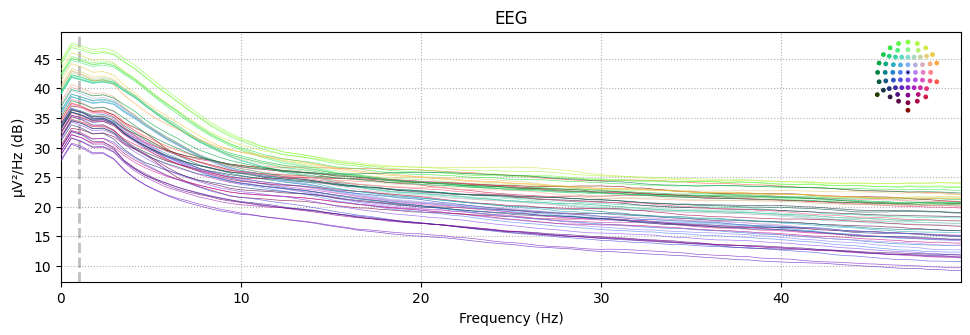

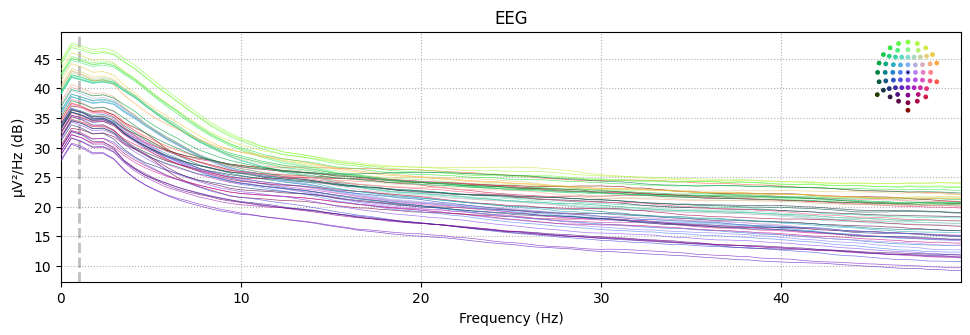

In [22]:
epochs_ar.compute_psd(fmax=50).plot()

    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


/Users/wazenmaichen/wazenmai/nthu-master/Brain Computer Interfaces/final_project/bci_env/lib/python3.9/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


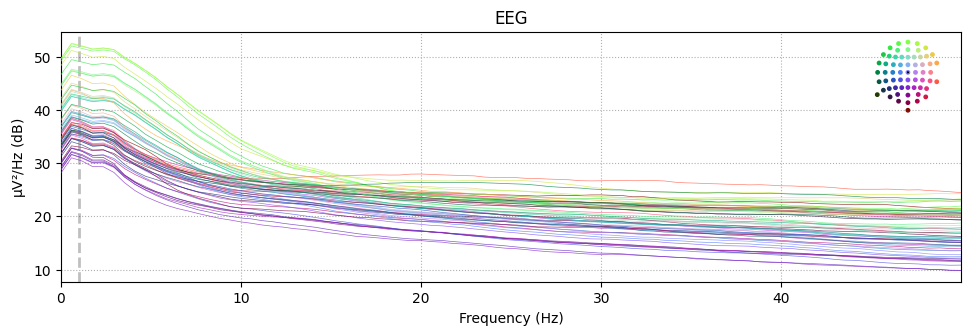

In [23]:
epochs.compute_psd(fmax=50).plot()

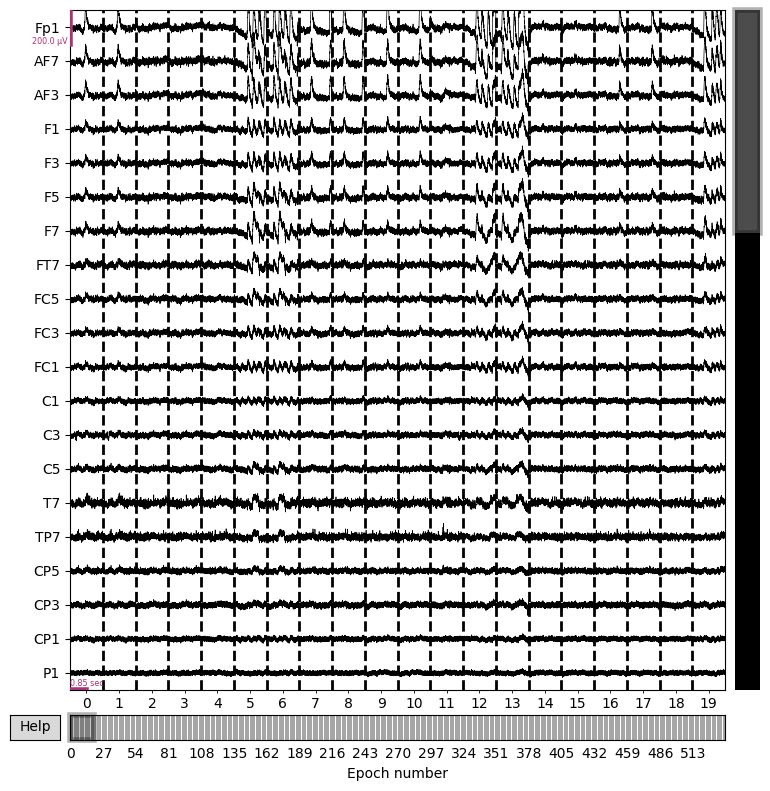

In [25]:
a = epochs.plot(scalings={"eeg":1e-4})

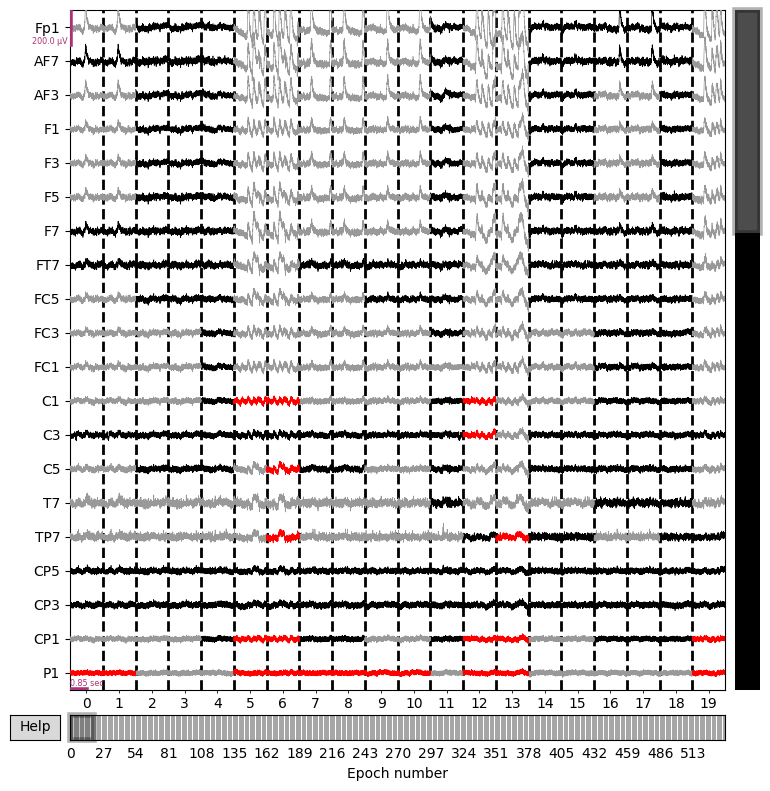

In [37]:
# visualize the rejected epochs
reject_log.plot_epochs(epochs, scalings={"eeg":1e-4});

## ASR

In [10]:
from scipy.linalg import toeplitz
from scipy import signal
from scipy.spatial.distance import cdist, euclidean
from scipy.special import gamma, gammaincinv
import scipy.linalg

def yulewalk(order, F, M):
    """Recursive filter design using a least-squares method.

    Examples
    --------
    Design an 8th-order lowpass filter and overplot the desired
    frequency response with the actual frequency response:
    >>> f = [0, .6, .6, 1]         # Frequency breakpoints
    >>> m = [1, 1, 0, 0]           # Magnitude breakpoints
    >>> [b, a] = yulewalk(8, f, m) # Filter design using least-squares method

    """
    F = np.asarray(F)
    M = np.asarray(M)
    npt = 512
    lap = np.fix(npt / 25).astype(int)
    mf = F.size
    npt = npt + 1  # For [dc 1 2 ... nyquist].
    Ht = np.array(np.zeros((1, npt)))
    nint = mf - 1
    df = np.diff(F)

    nb = 0
    Ht[0][0] = M[0]
    for i in range(nint):
        if df[i] == 0:
            nb = nb - int(lap / 2)
            ne = nb + lap
        else:
            ne = int(np.fix(F[i + 1] * npt)) - 1

        j = np.arange(nb, ne + 1)
        if ne == nb:
            inc = 0
        else:
            inc = (j - nb) / (ne - nb)

        Ht[0][nb:ne + 1] = np.array(inc * M[i + 1] + (1 - inc) * M[i])
        nb = ne + 1

    Ht = np.concatenate((Ht, Ht[0][-2:0:-1]), axis=None)
    n = Ht.size
    n2 = np.fix((n + 1) / 2)
    nb = order
    nr = 4 * order
    nt = np.arange(0, nr)

    # compute correlation function of magnitude squared response
    R = np.real(np.fft.ifft(Ht * Ht))
    R = R[0:nr] * (0.54 + 0.46 * np.cos(np.pi * nt / (nr - 1)))   # pick NR correlations  # noqa

    # Form window to be used in extracting the right "wing" of two-sided
    # covariance sequence
    Rwindow = np.concatenate(
        (1 / 2, np.ones((1, int(n2 - 1))), np.zeros((1, int(n - n2)))),
        axis=None)
    A = polystab(denf(R, order))  # compute denominator

    # compute additive decomposition
    Qh = numf(np.concatenate((R[0] / 2, R[1:nr]), axis=None), A, order)

    # compute impulse response
    _, Ss = 2 * np.real(signal.freqz(Qh, A, worN=n, whole=True))

    hh = np.fft.ifft(
        np.exp(np.fft.fft(Rwindow * np.fft.ifft(np.log(Ss, dtype=np.complex128))))  # noqa
    )
    B = np.real(numf(hh[0:nr], A, nb))

    return B, A

def denf(R, na):
    """Compute order NA denominator A from covariances R(0)...R(nr)."""
    nr = np.max(np.size(R))
    Rm = toeplitz(R[na:nr - 1], R[na:0:-1])
    Rhs = - R[na + 1:nr]
    A = np.concatenate(
        (1, np.linalg.lstsq(Rm, Rhs.T, rcond=None)[0].T), axis=None)
    return A

def polystab(a):
    v = np.roots(a)
    i = np.where(v != 0)
    vs = 0.5 * (np.sign(np.abs(v[i]) - 1) + 1)
    v[i] = (1 - vs) * v[i] + vs / np.conj(v[i])
    ind = np.where(a != 0)
    b = a[ind[0][0]] * np.poly(v)

    # Return only real coefficients if input was real:
    if not(np.sum(np.imag(a))):
        b = np.real(b)

    return b

def numf(h, a, nb):
    """Get numerator B given impulse-response h of B/A and denominator A."""
    nh = np.max(h.size)
    xn = np.concatenate((1, np.zeros((1, nh - 1))), axis=None)
    impr = signal.lfilter(np.array([1.0]), a, xn)

    b = np.linalg.lstsq(
        toeplitz(impr, np.concatenate((1, np.zeros((1, nb))), axis=None)),
        h.T, rcond=None)[0].T

    return b

def clean_windows(X, sfreq, max_bad_chans=0.2, zthresholds=[-3.5, 5],
                  win_len=.5, win_overlap=0.66, min_clean_fraction=0.25,
                  max_dropout_fraction=0.1):
    """Remove periods with abnormally high-power content from continuous data.
    """
    assert 0 < max_bad_chans < 1, "max_bad_chans must be a fraction !"

    # set internal variables
    truncate_quant = [0.0220, 0.6000]
    step_sizes = [0.01, 0.01]
    shape_range = np.arange(1.7, 3.5, 0.15)
    max_bad_chans = np.round(X.shape[0] * max_bad_chans)

    # set data indices
    [nc, ns] = X.shape
    N = int(win_len * sfreq)
    offsets = np.int_(np.round(np.arange(0, ns - N, (N * (1 - win_overlap)))))
    # logging.debug('[ASR] Determining channel-wise rejection thresholds')

    wz = np.zeros((nc, len(offsets)))
    for ichan in range(nc):

        # compute root mean squared amplitude
        x = X[ichan, :] ** 2
        Y = np.array([np.sqrt(np.sum(x[o:o + N]) / N) for o in offsets])

        # fit a distribution to the clean EEG part
        mu, sig, alpha, beta = fit_eeg_distribution(
            Y, min_clean_fraction, max_dropout_fraction, truncate_quant,
            step_sizes, shape_range)
        # calculate z scores
        wz[ichan] = (Y - mu) / sig

    # sort z scores into quantiles
    wz[np.isnan(wz)] = np.inf  # Nan to inf
    swz = np.sort(wz, axis=0)

    # determine which windows to remove
    if np.max(zthresholds) > 0:
        mask1 = swz[-(np.int64(max_bad_chans) + 1), :] > np.max(zthresholds)
    if np.min(zthresholds) < 0:
        mask2 = (swz[1 + np.int64(max_bad_chans - 1), :] < np.min(zthresholds))

    # combine the two thresholds
    remove_mask = np.logical_or.reduce((mask1, mask2))
    removed_wins = np.where(remove_mask)

    # reconstruct the samples to remove
    sample_maskidx = []
    for i in range(len(removed_wins[0])):
        if i == 0:
            sample_maskidx = np.arange(
                offsets[removed_wins[0][i]], offsets[removed_wins[0][i]] + N)
        else:
            sample_maskidx = np.vstack((
                sample_maskidx,
                np.arange(offsets[removed_wins[0][i]],
                          offsets[removed_wins[0][i]] + N)
            ))

    # delete the bad chunks from the data
    sample_mask2remove = np.unique(sample_maskidx)
    if sample_mask2remove.size:
        clean = np.delete(X, sample_mask2remove, 1)
        sample_mask = np.ones((1, ns), dtype=bool)
        sample_mask[0, sample_mask2remove] = False
    else:
        sample_mask = np.ones((1, ns), dtype=bool)

    return clean, sample_mask

def fit_eeg_distribution(X, min_clean_fraction=0.25, max_dropout_fraction=0.1,
                         fit_quantiles=[0.022, 0.6], step_sizes=[0.01, 0.01],
                         shape_range=np.arange(1.7, 3.5, 0.15)):
    # sort data so we can access quantiles directly
    X = np.sort(X)
    n = len(X)

    # compute z bounds for the truncated standard generalized Gaussian pdf and
    # pdf rescaler
    quants = np.array(fit_quantiles)
    zbounds = []
    rescale = []
    for b in range(len(shape_range)):
        gam = gammaincinv(
            1 / shape_range[b], np.sign(quants - 1 / 2) * (2 * quants - 1))
        zbounds.append(np.sign(quants - 1 / 2) * gam ** (1 / shape_range[b]))
        rescale.append(shape_range[b] / (2 * gamma(1 / shape_range[b])))

    # determine the quantile-dependent limits for the grid search
    # we can generally skip the tail below the lower quantile
    lower_min = np.min(quants)
    # maximum width is the fit interval if all data is cleanT
    max_width = np.diff(quants)
    # minimum width of the fit interval, as fraction of data
    min_width = min_clean_fraction * max_width

    # Build quantile interval matrix
    cols = np.arange(lower_min,
                     lower_min + max_dropout_fraction + step_sizes[0] * 1e-9,
                     step_sizes[0])
    cols = np.round(n * cols).astype(int)
    rows = np.arange(0, int(np.round(n * max_width)))
    newX = np.zeros((len(rows), len(cols)))
    for i, c in enumerate(range(len(rows))):
        newX[i] = X[c + cols]

    # subtract baseline value for each interval
    X1 = newX[0, :]
    newX = newX - X1

    opt_val = np.inf
    opt_lu = np.inf
    opt_bounds = np.inf
    opt_beta = np.inf
    gridsearch = np.round(n * np.arange(max_width, min_width, -step_sizes[1]))
    for m in gridsearch.astype(int):
        mcurr = m - 1
        nbins = int(np.round(3 * np.log2(1 + m / 2)))
        cols = nbins / newX[mcurr]
        H = newX[:m] * cols

        hist_all = []
        for ih in range(len(cols)):
            histcurr = np.histogram(H[:, ih], bins=np.arange(0, nbins + 1))
            hist_all.append(histcurr[0])
        hist_all = np.array(hist_all, dtype=int).T
        hist_all = np.vstack((hist_all, np.zeros(len(cols), dtype=int)))
        logq = np.log(hist_all + 0.01)

        # for each shape value...
        for k, b in enumerate(shape_range):
            bounds = zbounds[k]
            x = bounds[0] + np.arange(0.5, nbins + 0.5) / nbins * np.diff(bounds)  # noqa:E501
            p = np.exp(-np.abs(x) ** b) * rescale[k]
            p = p / np.sum(p)

            # calc KL divergences
            kl = np.sum(p * (np.log(p) - logq[:-1, :].T), axis=1) + np.log(m)

            # update optimal parameters
            min_val = np.min(kl)
            idx = np.argmin(kl)
            if min_val < opt_val:
                opt_val = min_val
                opt_beta = shape_range[k]
                opt_bounds = bounds
                opt_lu = [X1[idx], X1[idx] + newX[m - 1, idx]]

    # recover distribution parameters at optimum
    alpha = (opt_lu[1] - opt_lu[0]) / np.diff(opt_bounds)
    mu = opt_lu[0] - opt_bounds[0] * alpha
    beta = opt_beta

    # calculate the distribution's standard deviation from alpha and beta
    sig = np.sqrt((alpha ** 2) * gamma(3 / beta) / gamma(1 / beta))

    return mu, sig, alpha, beta

def asr_calibrate(X, sfreq, cutoff=20, blocksize=100, win_len=0.5,
                  win_overlap=0.66, max_dropout_fraction=0.1,
                  min_clean_fraction=0.25, ab=None, method='euclid'):
   
    if method == "riemann":
        warnings.warn("Riemannian ASR is not yet supported. Switching back to"
                      " Euclidean ASR.")
        method == "euclid"

    # logging.debug('[ASR] Calibrating...')
    print('[ASR] Calibrating...')

    # set number of channels and number of samples
    [nc, ns] = X.shape

    # filter the data
    X, _zf = yulewalk_filter(X, sfreq, ab=ab)

    # window length for calculating thresholds
    N = int(np.round(win_len * sfreq))

    # get block covariances
    U = block_covariance(X, window=blocksize)

    # get geometric median for each block
    # Note: riemann mode is not yet supported, else this could be:
    # Uavg = pyriemann.utils.mean_covariance(U, metric='riemann')
    Uavg = geometric_median(U.reshape((-1, nc * nc)) / blocksize)
    Uavg = Uavg.reshape((nc, nc))

    # get the mixing matrix M
    M = scipy.linalg.sqrtm(np.real(Uavg))

    # sort the get the sorted eigenvecotors/eigenvalues
    # riemann is not yet supported, else this could be PGA/nonlinear eigenvs
    D, Vtmp = scipy.linalg.eigh(M)
    V = Vtmp[:, np.argsort(D)]  # I think numpy sorts them automatically

    # get the threshold matrix T
    x = np.abs(np.dot(V.T, X))
    offsets = np.int_(np.arange(0, ns - N, np.round(N * (1 - win_overlap))))

    # go through all the channels and fit the EEG distribution
    mu = np.zeros(nc)
    sig = np.zeros(nc)
    for ichan in reversed(range(nc)):
        rms = x[ichan, :] ** 2
        Y = []
        for o in offsets:
            Y.append(np.sqrt(np.sum(rms[o:o + N]) / N))
        mu[ichan], sig[ichan], alpha, beta = fit_eeg_distribution(
            Y, min_clean_fraction, max_dropout_fraction)
    T = np.dot(np.diag(mu + cutoff * sig), V.T)

    print('[ASR] Calibration done.')
    return M, T

def yulewalk_filter(X, sfreq, zi=None, ab=None, axis=-1):
    # Set default IIR filter coefficients
    if ab is None:
        F = np.array([0, 2, 3, 13, 16, 40, np.minimum(
            80.0, (sfreq / 2.0) - 1.0), sfreq / 2.0]) * 2.0 / sfreq
        M = np.array([3, 0.75, 0.33, 0.33, 1, 1, 3, 3])
        B, A = yulewalk(8, F, M)
    else:
        A, B = ab

    # apply the signal shaping filter and initialize the IIR filter state
    if zi is None:
        out = signal.lfilter(B, A, X, axis=axis)
        zf = None
    else:
        out, zf = signal.lfilter(B, A, X, zi=zi, axis=axis)

    return out, zf

def block_covariance(data, window=128):
    n_ch, n_times = data.shape
    U = np.zeros([len(np.arange(0, n_times - 1, window)), n_ch**2])
    data = data.T
    for k in range(0, window):
        idx_range = np.minimum(n_times - 1,
                               np.arange(k, n_times + k - 2, window))
        U = U + np.reshape(data[idx_range].reshape([-1, 1, n_ch]) *
                           data[idx_range].reshape(-1, n_ch, 1), U.shape)

    return np.array(U)

def geometric_median(X, tol=1e-5, max_iter=500):
    y = np.mean(X, 0)  # initial value

    i = 0
    while i < max_iter:
        D = cdist(X, [y])
        nonzeros = (D != 0)[:, 0]

        Dinv = 1. / D[nonzeros]
        Dinvs = np.sum(Dinv)
        W = Dinv / Dinvs
        T = np.sum(W * X[nonzeros], 0)

        num_zeros = len(X) - np.sum(nonzeros)
        if num_zeros == 0:
            y1 = T
        elif num_zeros == len(X):
            return y
        else:
            R = (T - y) * Dinvs
            r = np.linalg.norm(R)
            rinv = 0 if r == 0 else num_zeros / r
            y1 = max(0, 1 - rinv) * T + min(1, rinv) * y

        if euclidean(y, y1) < tol:
            return y1

        y = y1
        i += 1
    else:
        print(f"Geometric median could converge in {i} iterations "
              f"with a tolerance of {tol}")
        
def asr_process(data, sfreq, M, T, windowlen=0.5, lookahead=0.25, stepsize=32,
                maxdims=0.66, ab=None, R=None, Zi=None, cov=None, carry=None,
                return_states=False, method="euclid", mem_splits=3):
    """Apply the Artifact Subspace Reconstruction method to a data array.
    """
    if method == "riemann":
        warnings.warn("Riemannian ASR is not yet supported. Switching back to"
                      " Euclidean ASR.")
        method == "euclid"

    # calculate the the actual max dims based on the fraction parameter
    if maxdims < 1:
        maxdims = np.round(len(data) * maxdims)

    # set initial filter conditions of none was passed
    if Zi is None:
        _, Zi = yulewalk_filter(data, ab=ab, sfreq=sfreq,
                                zi=np.ones([len(data), 8]))
    
    # set the number of channels
    C, S = data.shape

    # set the number of windows
    N = np.round(windowlen * sfreq).astype(int)
    P = np.round(lookahead * sfreq).astype(int)

    # interpolate a portion of the data if no buffer was given
    if carry is None:
        carry = np.tile(2 * data[:, 0],
                        (P, 1)).T - data[:, np.mod(np.arange(P, 0, -1), S)]
    data = np.concatenate([carry, data], axis=-1)

    # splits = np.ceil(C*C*S*8*8 + C*C*8*s/stepsize + C*S*8*2 + S*8*5)...
    splits = mem_splits  # TODO: use this for parallelization MAKE IT A PARAM FIRST

    # loop over smaller segments of the data (for memory purposes)
    last_trivial = False
    last_R = None
    print("loop over smaller segments of the data...", splits)
    for i in range(splits):
        print(i)
        # set the current range
        i_range = np.arange(i * S // splits,
                            np.min([(i + 1) * S // splits, S]),
                            dtype=int)
        
        print("filter the cuurent window with yule-walker")
        # filter the current window with yule-walker
        X, Zi = yulewalk_filter(data[:, i_range + P], sfreq=sfreq,
                                zi=Zi, ab=ab, axis=-1)
        
        print("compute moving average covarinace...")
        # compute a moving average covariance
        Xcov, cov = \
            ma_filter(N,
                      np.reshape(np.multiply(np.reshape(X, (1, C, -1)),
                                             np.reshape(X, (C, 1, -1))),
                                 (C * C, -1)), cov)

        # set indices at which we update the signal
        update_at = np.arange(stepsize,
                              Xcov.shape[-1] + stepsize - 2,
                              stepsize)
        update_at = np.minimum(update_at, Xcov.shape[-1]) - 1

        # set the previous reconstruction matrix if none was assigned
        if last_R is None:
            update_at = np.concatenate([[0], update_at])
            last_R = np.eye(C)

        Xcov = np.reshape(Xcov[:, update_at], (C, C, -1))

        # loop through the updating intervals
        last_n = 0
        print("loop through the updating intervals...", update_at)
        for j in range(len(update_at) - 1):

            # get the eigenvectors/values.For method 'riemann', this should
            # be replaced with PGA/ nonlinear eigenvalues
            D, V = np.linalg.eigh(Xcov[:, :, j])

            # determine which components to keep
            keep = np.logical_or(D < np.sum((T @ V)**2, axis=0),
                                 np.arange(C) + 1 < (C - maxdims))
            trivial = np.all(keep)

            # set the reconstruction matrix (ie. reconstructing artifact
            # components using the mixing matrix)
            if not trivial:
                inv = pinv(np.multiply(keep[:, np.newaxis], V.T @ M))
                R = np.real(M @ inv @ V.T)
            else:
                R = np.eye(C)

            # apply the reconstruction
            n = update_at[j] + 1
            if (not trivial) or (not last_trivial):

                subrange = i_range[np.arange(last_n, n)]

                # generate a cosine signal
                blend_x = np.pi * np.arange(1, n - last_n + 1) / (n - last_n)
                blend = (1 - np.cos(blend_x)) / 2

                # use cosine blending to replace data with reconstructed data
                tmp_data = data[:, subrange]
                data[:, subrange] = np.multiply(blend, R @ tmp_data) + \
                                    np.multiply(1 - blend, last_R @ tmp_data) # noqa

            # set the parameters for the next iteration
            last_n, last_R, last_trivial = n, R, trivial

    # assign a new lookahead portion
    carry = np.concatenate([carry, data[:, -P:]])
    carry = carry[:, -P:]

    if return_states:
        return data[:, :-P], {"M": M, "T": T, "R": R, "Zi": Zi,
                              "cov": cov, "carry": carry}
    else:
        return data[:, :-P]
    
def ma_filter(N, X, Zi):
    if Zi is None:
        Zi = np.zeros([len(X), N])
    print("ma_filter")
    Y = np.concatenate([Zi, X], axis=1)
    M = Y.shape[-1]
    print("stack I_")
    I_ = np.stack([np.arange(M - N),
                   np.arange(N, M)]).astype(int)
    print("stack S_")
    S = (np.stack([-np.ones(M - N),
                   np.ones(M - N)]) / N)
    print("stack X_")
    X = np.cumsum(np.multiply(Y[:, np.reshape(I_.T, -1)],
                              np.reshape(S.T, [-1])), axis=-1)

    X = X[:, 1::2]

    Zf = np.concatenate([-(X[:, -1] * N - Y[:, -N])[:, np.newaxis],
                         Y[:, -N + 1:]], axis=-1)
    return X, Zf

In [11]:
class ASR():
    def __init__(self, sfreq, cutoff=20, blocksize=100, win_len=0.5,
                 win_overlap=0.66, max_dropout_fraction=0.1,
                 min_clean_fraction=0.25, ab=None, max_bad_chans=0.1,
                 method="euclid"):

        # set attributes
        self.sfreq = sfreq
        self.cutoff = cutoff
        self.blocksize = blocksize
        self.win_len = win_len
        self.win_overlap = win_overlap
        self.max_dropout_fraction = max_dropout_fraction
        self.min_clean_fraction = min_clean_fraction
        self.max_bad_chans = max_bad_chans
        self.method = "euclid"  # NOTE: riemann is not yet available
        self._fitted = False

        # set default yule-walker filter
        if ab is None:
            yw_f = np.array([0, 2, 3, 13, 16, 40,
                             np.minimum(80.0, (self.sfreq / 2.0) - 1.0),
                             self.sfreq / 2.0]) * 2.0 / self.sfreq
            yw_m = np.array([3, 0.75, 0.33, 0.33, 1, 1, 3, 3])
            self.B, self.A = yulewalk(8, yw_f, yw_m)
        else:
            self.A, self.B = ab

        self._reset()

    def _reset(self):
        """Reset state variables."""
        self.M = None
        self.T = None

        # TODO: The following parameters are effectively not used. Still,
        #  they can be set manually via asr.transform(return_states=True)
        self.R = None
        self.carry = None
        self.Zi = None
        self.cov = None
        self._fitted = False

    def fit(self, raw, picks="eeg", start=0, stop=None,
            return_clean_window=False):
        """Calibration for the Artifact Subspace Reconstruction method.

        Returns
        -------
        clean : array, shape=(n_channels, n_samples)
            The cropped version of the dataset which was used to calibrate
            the ASR. This array is a result of the `clean_windows` function
            and no ASR was applied to it.
        sample_mask : boolean array, shape=(1, n_samples)
            Logical mask of the samples which were used to train the ASR.

        """
        
        # extract the data
        X = raw.get_data(picks=picks, start=start, stop=stop)
        
        # Find artifact-free windows first
        clean, sample_mask = clean_windows(
            X,
            sfreq=self.sfreq,
            win_len=self.win_len,
            win_overlap=self.win_overlap,
            max_bad_chans=self.max_bad_chans,
            min_clean_fraction=self.min_clean_fraction,
            max_dropout_fraction=self.max_dropout_fraction)

        # Perform calibration
        self.M, self.T = asr_calibrate(
            clean,
            sfreq=self.sfreq,
            cutoff=self.cutoff,
            blocksize=self.blocksize,
            win_len=self.win_len,
            win_overlap=self.win_overlap,
            max_dropout_fraction=self.max_dropout_fraction,
            min_clean_fraction=self.min_clean_fraction,
            ab=(self.A, self.B),
            method=self.method)

        self._fitted = True

        # return data if required
        if return_clean_window:
            return clean, sample_mask

    def transform(self, raw, picks="eeg", lookahead=0.25, stepsize=32, 
                  maxdims=0.66, return_states=False, mem_splits=3):
        """Apply Artifact Subspace Reconstruction.
        """
        # extract the data
        X = raw.get_data(picks=picks)
        
        # add lookahead padding at the end
        lookahead_samples = int(self.sfreq * lookahead)
        X = np.concatenate([X,
                            np.zeros([X.shape[0], lookahead_samples])],
                          axis=1)
        
        # apply ASR
        X = asr_process(X, self.sfreq, self.M, self.T, self.win_len,
                        lookahead, stepsize, maxdims, (self.A, self.B),
                        self.R, self.Zi, self.cov, self.carry,
                        return_states, self.method, mem_splits)
        
        # remove lookahead portion from start
        X = X[:, lookahead_samples:]
        
        # Return a modifier raw instance
        raw = raw.copy()
        raw.apply_function(lambda x: X, picks=picks,
                           channel_wise=False)
        return raw

In [ ]:
# define the needed variables from our dafta
sfreq = raw.info["sfreq"]
data = raw.get_data()

# define the ASR object with standard parameters
asr = ASR(sfreq=sfreq, cutoff=5)

# fit it to the first 100 seconds of the recording
asr.fit(raw.copy().crop(tmax=100))

# create a copy of our data and fill in the ASR cleaned data

raw_asr = asr.transform(raw)

# create epochs from the cleaned data
epochs_asr = mne.Epochs(raw_asr, events, event_id, tmin, tmax, baseline=None,
                        reject=None, verbose=False, detrend=0, preload=True)

[ASR] Calibrating...
[ASR] Calibration done.
loop over smaller segments of the data... 3
0
filter the cuurent window with yule-walker
compute moving average covarinace...


In [ ]:
# define the temporal window and unit scale we want to investigate
start = 35
duration = 10
scalings = {"eeg":1e-4}

# plot the uncleaned data compared to the ASR cleaned data
raw.plot(start=start, duration=duration, scalings=scalings, title="raw");
raw_asr.plot(start=start, duration=duration, scalings=scalings,
             title="after ASR");

# Play on MNE Official data

In [27]:
import os
from copy import deepcopy
import numpy as np
import mne

sample_data_folder = mne.datasets.sample.data_path()
sample_data_raw_file = os.path.join(
    sample_data_folder, "MEG", "sample", "sample_audvis_raw.fif"
)
raw = mne.io.read_raw_fif(sample_data_raw_file, verbose=False)

Using default location ~/mne_data for sample...
Creating ~/mne_data


100%|██████████████████████████████████████| 1.65G/1.65G [00:00<00:00, 350GB/s]
Untarring contents of '/Users/wazenmaichen/mne_data/MNE-sample-data-processed.tar.gz' to '/Users/wazenmaichen/mne_data'


Attempting to create new mne-python configuration file:
/Users/wazenmaichen/.mne/mne-python.json


In [28]:
raw.info

<Info | 21 non-empty values
 acq_pars: ACQch001 110113 ACQch002 110112 ACQch003 110111 ACQch004 110122 ...
 bads: 2 items (MEG 2443, EEG 053)
 ch_names: MEG 0113, MEG 0112, MEG 0111, MEG 0122, MEG 0123, MEG 0121, MEG ...
 chs: 204 Gradiometers, 102 Magnetometers, 9 Stimulus, 60 EEG, 1 EOG
 custom_ref_applied: False
 description: acquisition (megacq) VectorView system at NMR-MGH
 dev_head_t: MEG device -> head transform
 dig: 146 items (3 Cardinal, 4 HPI, 61 EEG, 78 Extra)
 events: 1 item (list)
 experimenter: MEG
 file_id: 4 items (dict)
 highpass: 0.1 Hz
 hpi_meas: 1 item (list)
 hpi_results: 1 item (list)
 lowpass: 172.2 Hz
 meas_date: 2002-12-03 19:01:10 UTC
 meas_id: 4 items (dict)
 nchan: 376
 proj_id: 1 item (ndarray)
 proj_name: test
 projs: PCA-v1: off, PCA-v2: off, PCA-v3: off
 sfreq: 600.6 Hz
>

In [29]:
print(raw.ch_names, len(raw.ch_names))

['MEG 0113', 'MEG 0112', 'MEG 0111', 'MEG 0122', 'MEG 0123', 'MEG 0121', 'MEG 0132', 'MEG 0133', 'MEG 0131', 'MEG 0143', 'MEG 0142', 'MEG 0141', 'MEG 0213', 'MEG 0212', 'MEG 0211', 'MEG 0222', 'MEG 0223', 'MEG 0221', 'MEG 0232', 'MEG 0233', 'MEG 0231', 'MEG 0243', 'MEG 0242', 'MEG 0241', 'MEG 0313', 'MEG 0312', 'MEG 0311', 'MEG 0322', 'MEG 0323', 'MEG 0321', 'MEG 0333', 'MEG 0332', 'MEG 0331', 'MEG 0343', 'MEG 0342', 'MEG 0341', 'MEG 0413', 'MEG 0412', 'MEG 0411', 'MEG 0422', 'MEG 0423', 'MEG 0421', 'MEG 0432', 'MEG 0433', 'MEG 0431', 'MEG 0443', 'MEG 0442', 'MEG 0441', 'MEG 0513', 'MEG 0512', 'MEG 0511', 'MEG 0523', 'MEG 0522', 'MEG 0521', 'MEG 0532', 'MEG 0533', 'MEG 0531', 'MEG 0542', 'MEG 0543', 'MEG 0541', 'MEG 0613', 'MEG 0612', 'MEG 0611', 'MEG 0622', 'MEG 0623', 'MEG 0621', 'MEG 0633', 'MEG 0632', 'MEG 0631', 'MEG 0642', 'MEG 0643', 'MEG 0641', 'MEG 0713', 'MEG 0712', 'MEG 0711', 'MEG 0723', 'MEG 0722', 'MEG 0721', 'MEG 0733', 'MEG 0732', 'MEG 0731', 'MEG 0743', 'MEG 0742', 'ME

In [30]:
raw.info['dig']

[<DigPoint |        LPA : (-71.4, 0.0, 0.0) mm      : head frame>,
 <DigPoint |     Nasion : (0.0, 102.6, 0.0) mm      : head frame>,
 <DigPoint |        RPA : (75.3, 0.0, 0.0) mm       : head frame>,
 <DigPoint |     HPI #1 : (32.9, 99.0, 79.8) mm     : head frame>,
 <DigPoint |     HPI #2 : (-70.0, 67.7, 68.9) mm    : head frame>,
 <DigPoint |     HPI #3 : (-72.6, -20.9, 97.1) mm   : head frame>,
 <DigPoint |     HPI #4 : (50.0, -7.2, 122.9) mm    : head frame>,
 <DigPoint |   Extra #1 : (6.5, 109.8, -45.8) mm    : head frame>,
 <DigPoint |   Extra #2 : (5.6, 111.5, -34.7) mm    : head frame>,
 <DigPoint |   Extra #3 : (5.2, 110.0, -27.4) mm    : head frame>,
 <DigPoint |   Extra #4 : (6.2, 105.5, -18.9) mm    : head frame>,
 <DigPoint |   Extra #5 : (4.7, 103.9, -6.4) mm     : head frame>,
 <DigPoint |   Extra #6 : (3.3, 113.9, 15.4) mm     : head frame>,
 <DigPoint |   Extra #7 : (1.7, 115.4, 28.3) mm     : head frame>,
 <DigPoint |   Extra #8 : (3.7, 116.2, 38.7) mm     : head fra